# Data Exploration Project - Pumps

## Business Understanding

Daten über verschiedene Brunnen in einem afrikanischen Land.

**Können wir vorhersagen welche Brunnen defekt, wartungsbedürftig oder voll funktional sind?**

## Data Understanding

In [1]:
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np
import geopandas as gpd

Einlesen der Trainings- und Testdaten.

In [411]:
df_pump_train = pd.read_csv('pump_train.csv')
df_pump_test = pd.read_csv('pump_test.csv')

Zufälliges Sample aus dem Datensatz gibt einen Überblick zu den vorhandenen Informationen.

In [28]:
df_pump_test.sample(5)

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
1581,27994,200.0,2011-03-11,Government Of Tanzania,1789,DWE,38.242650,-4.576416,Kwa Mzee Iddi Kilua,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,non functional
5645,21376,0.0,2011-08-10,Kkkt,0,KKKT,32.912211,-8.784676,Ipogoro,0,...,soft,good,seasonal,seasonal,shallow well,shallow well,groundwater,hand pump,hand pump,functional
5364,38484,0.0,2012-10-23,Government Of Tanzania,1363,Government,34.004146,-1.801148,Kwa Mzee Gaspar,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,non functional
6576,40602,0.0,2013-02-01,Lga,365,LGA,39.125108,-10.854212,Bwamkuu,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional needs repair
3437,28671,0.0,2013-02-14,Government Of Tanzania,1222,DWE,35.893416,-4.171073,Shuleni Sora,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional


### Data Dictionary
| Variable | Beschreibung |
| -------- | ------------ |
| amount_tsh | Total static head (amount water available to waterpoint) |
| date_recorded | The date the row was entered |
| funder | Who funded the well |
| gps_height | Altitude of the well |
| installer | Organization that installed the well |
| longitude | GPS coordinate |
| latitude | GPS coordinate |
| wpt_name | Name of the waterpoint if there is one |
| num_private | ? |
| basin | Geographic water basin |
| subvillage | Geographic location |
| region | Geographic location |
| region_code | Geographic location (coded) |
| district_code | Geographic location (coded) |
| lga | Geographic location |
| ward | Geographic location |
| population | Population around the well |
| public_meeting | True/False |
| recorded_by | Group entering this row of data 
| scheme_management | Who operates the waterpoint |
| scheme_name | Who operates the waterpoint |
| permit | If the waterpoint is permitted |
| construction_year | Year the waterpoint was constructed 
| extraction_type | The kind of extraction the waterpoint uses 
| extraction_type_group | The kind of extraction the waterpoint uses |
| extraction_type_class | The kind of extraction the waterpoint uses 
| management | How the waterpoint is managed |
| management_group | How the waterpoint is managed |
| payment | What the water costs |
| payment_type | What the water costs |
| water_quality | The quality of the water |
| quality_group | The quality of the water |
| quantity | The quantity of water |
| quantity_group | The quantity of water |
| source | The source of the water |
| source_type | The source of the water |
| source_class | The source of the water |
| waterpoint_type | The kind of waterpoint |
| waterpoint_type_group | The kind of waterpoint |
| status_group | functional or non-functional or functional needs repair |

### Data Analysis

Die Datentypen des Dataframes sind hauptsächlich vom Typ 'object' -> Strings.

In einigen Spalten befinden sich Nullwerte.

In [29]:
df_pump_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8910 entries, 0 to 8909
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     8910 non-null   int64  
 1   amount_tsh             8910 non-null   float64
 2   date_recorded          8910 non-null   object 
 3   funder                 8369 non-null   object 
 4   gps_height             8910 non-null   int64  
 5   installer              8365 non-null   object 
 6   longitude              8910 non-null   float64
 7   latitude               8910 non-null   float64
 8   wpt_name               8910 non-null   object 
 9   num_private            8910 non-null   int64  
 10  basin                  8910 non-null   object 
 11  subvillage             8854 non-null   object 
 12  region                 8910 non-null   object 
 13  region_code            8910 non-null   int64  
 14  district_code          8910 non-null   int64  
 15  lga 

Die 'id' eignet sich als Index für das Dataframe.

Das Datum in der Spalte 'date_recorded' soll als solche erkannt werden.

Änderungen auf einer Kopie des Datensatzes, damit eine Rohversion weiterhin verfügbar bleibt.

In [5]:
df_pump_train1 = df_pump_train.copy().set_index('id')
df_pump_train1['date_recorded'] = pd.to_datetime(df_pump_test['date_recorded'])
df_pump_train1.sort_index()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,
0,0.0,2011-03-14,Tasaf,0,TASAF,33.125828,-5.118154,Mratibu,0,Lake Tanganyika,...,milky,milky,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
2,0.0,2011-02-20,Lvia,0,LVIA,36.115056,-6.279268,Bombani,0,Wami / Ruvu,...,soft,good,insufficient,insufficient,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,functional
3,10.0,2011-09-04,Germany Republi,1639,CES,37.147432,-3.187555,Area 7 Namba 5,0,Pangani,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
4,0.0,2011-07-22,Cmsr,0,CMSR,36.164893,-6.099289,Ezeleda,0,Wami / Ruvu,...,soft,good,dry,dry,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
5,50.0,2011-02-20,Private,28,Private,39.286124,-6.972403,Kwa Namaj,0,Wami / Ruvu,...,soft,good,enough,enough,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74238,40.0,NaT,District Council,321,Handeni Trunk Main(,38.389222,-5.531824,Kwa Lugendo,14,Pangani,...,soft,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe,non functional
74240,0.0,NaT,World Vision,1183,World vision,37.007726,-3.280868,Upendo Primary School,0,Pangani,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
74242,0.0,NaT,Danida,0,DANIDA,33.724987,-8.940758,Kwa Mvulula,0,Rufiji,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional


Der Datensatz hat 50.490 Zeilen und 41 Spalten (inkl. id).

In [6]:
print("Rows: ", df_pump_train.shape[0])
print("Columns: ", df_pump_train.shape[1])

Rows:  50490
Columns:  41


Einige Spalten beinhalten Nullwerte.

In [7]:
df_pump_train.isna().any()

id                       False
amount_tsh               False
date_recorded            False
funder                    True
gps_height               False
installer                 True
longitude                False
latitude                 False
wpt_name                 False
num_private              False
basin                    False
subvillage                True
region                   False
region_code              False
district_code            False
lga                      False
ward                     False
population               False
public_meeting            True
recorded_by              False
scheme_management         True
scheme_name               True
permit                    True
construction_year        False
extraction_type          False
extraction_type_group    False
extraction_type_class    False
management               False
management_group         False
payment                  False
payment_type             False
water_quality            False
quality_

Der Umgang mit den Nullwerten in den Spalten 'funder', 'installer', 'subvillage', 'public_meeting', 'scheme_management', 'scheme_name', 'permit' müssen ggf. in der Data Preparation behandelt werden.

In [8]:
print(df_pump_train.isnull().sum(), 
      df_pump_train.columns[pd.isnull(df_pump_train).any()].tolist(), sep='\n')

id                           0
amount_tsh                   0
date_recorded                0
funder                    3094
gps_height                   0
installer                 3110
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 315
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            2846
recorded_by                  0
scheme_management         3269
scheme_name              23942
permit                    2591
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

Initiale Beschreibung des Dataframes für einen besseren Überblick zu der Beschaffenheit der Features.

In [9]:
df_pump_train.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,50490.0,NaN,NaN,NaN,37113.857695,21447.241039,0.0,18517.25,37027.5,55636.75,74247.0
amount_tsh,50490.0,NaN,NaN,NaN,319.158123,2987.517185,0.0,0.0,0.0,20.0,350000.0
date_recorded,50490,348,2011-03-15,490,NaN,NaN,NaN,NaN,NaN,NaN,NaN
funder,47396,1734,Government Of Tanzania,7697,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gps_height,50490.0,NaN,NaN,NaN,669.71428,693.12333,-90.0,0.0,371.0,1322.0,2770.0
installer,47380,1964,DWE,14799,NaN,NaN,NaN,NaN,NaN,NaN,NaN
longitude,50490.0,NaN,NaN,NaN,34.078591,6.553382,0.0,33.084409,34.906548,37.178899,40.345193
latitude,50490.0,NaN,NaN,NaN,-5.708336,2.943806,-11.648378,-8.541643,-5.019807,-3.32755,-0.0
wpt_name,50490,32390,none,3026,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_private,50490.0,NaN,NaN,NaN,0.459497,10.413455,0.0,0.0,0.0,0.0,1402.0


Es liegen Daten von 2004 bis 2013 vor, über Lücken kann keine Aussage getroffen werden.

In [10]:
print('Recorded timeframe', df_pump_train1['date_recorded'].min().date(), df_pump_train1['date_recorded'].max().date())

Recorded timeframe 2004-03-01 2013-12-03


Alle Daten wurden von GeoData Consultants Ltd erhoben. Diese Spalte ist also für das Modell nicht nutzbar.

In [11]:
df_pump_train['recorded_by'].unique()

array(['GeoData Consultants Ltd'], dtype=object)

Nur etwas gut die Hälfte der Brunnen sind voll funktional.

<AxesSubplot:title={'center':'Pump Status'}>

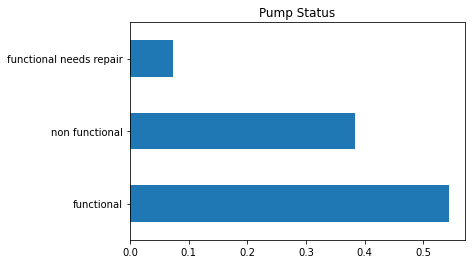

In [12]:
df_pump_train['status_group'].value_counts(normalize=True).plot(kind='barh', title='Pump Status')

Die geografische Verteilung der Brunnen lässt sich grafisch darstellen.

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

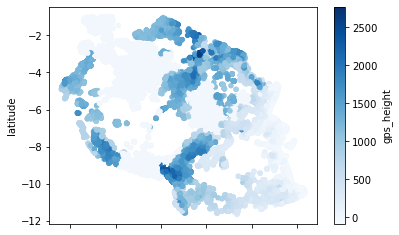

In [13]:
df_pump_train[(df_pump_train['longitude'] != 0) & (df_pump_train['latitude'] != 0)].plot(x="longitude", y="latitude", kind="scatter", c="gps_height", colormap="Blues")

Die erfassten Brunnen konzentrieren sich auf ein relativ enges Gebiet in Afrika.

<AxesSubplot:title={'center':'Geographic Distribution'}, xlabel='longitude', ylabel='latitude'>

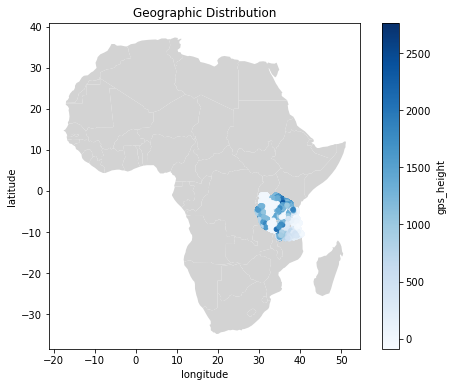

In [14]:
# Source: https://towardsdatascience.com/the-easiest-way-to-plot-data-from-pandas-on-a-world-map-1a62962a27f3

# # initialize an axis
fig, ax = plt.subplots(figsize=(8,6))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["continent"] == "Africa"].plot(color="lightgrey", ax=ax)
df_pump_train[(df_pump_train['longitude'] != 0) & (df_pump_train['latitude'] != 0)].plot(x="longitude", 
                                                            y="latitude", 
                                                            kind="scatter", 
                                                            c="gps_height", 
                                                            colormap="Blues", 
                                                            title="Geographic Distribution",
                                                            ax=ax)


Für die meisten Brunnen gilt 'public_meeting'.

<AxesSubplot:title={'center':'Is the waterpoint public?'}, ylabel='public_meeting'>

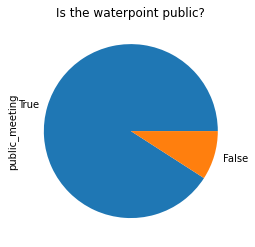

In [15]:
df_pump_train['public_meeting'].value_counts().plot(kind='pie', title='Is the waterpoint public?')

Ein beachtlicher Teil der Brunnen hat keine Genehmigung.

<AxesSubplot:title={'center':'Is the waterpoint permitted?'}, ylabel='permit'>

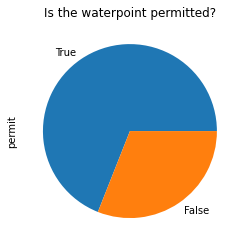

In [16]:
df_pump_train['permit'].value_counts().plot(kind='pie', title='Is the waterpoint permitted?')

In den Jahren seit 1960 wurden zunehmend mehr Brunnen gebaut.

Text(0, 0.5, 'Count')

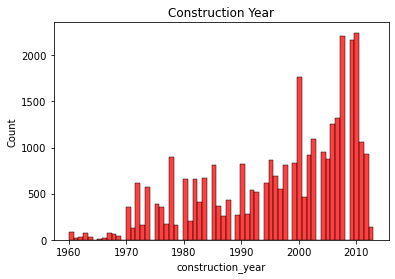

In [17]:
sns.histplot(df_pump_train[df_pump_train['construction_year'] != 0]['construction_year'],
                bins=64,
                kde=False,
                color="red")
plt.title("Construction Year")
plt.ylabel("Count")

<AxesSubplot:title={'center':'Waterpoint Type'}>

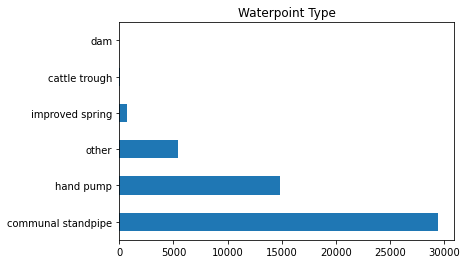

In [18]:
df_pump_train['waterpoint_type_group'].value_counts().plot(kind='barh', title='Waterpoint Type')

Oft ist die Quelle Grundwasser.

<AxesSubplot:title={'center':'Source'}, ylabel='source_class'>

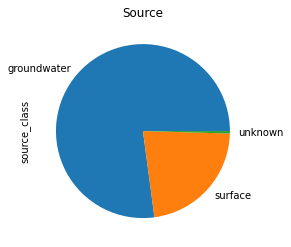

In [19]:
df_pump_train['source_class'].value_counts().plot(kind='pie', title='Source')

Die Korrelation kann vorerst nur für bereits numerische Werte durchgeführt werden. Viele der kategorischen object Features müssen erst noch entsprechend vorbereitet werden. Bereits jetzt lässt sich ein Zusammenhang zwischen der gps_hight und dem construction_year erkennen, allerdings kann es sich auch um eine Beziehung aufgrund der Art der Datenaufzeichnung handeln.

<AxesSubplot:title={'center':'Correlation between numeric features'}>

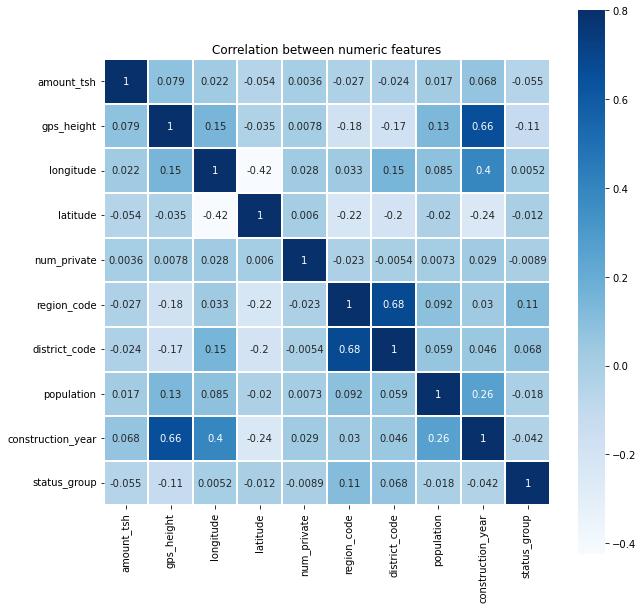

In [20]:
some_map = {label:idx for idx,label in enumerate(np.unique(df_pump_train1['status_group']))} #create a map w.r.t the category column
df_pump_train1['status_group'] = df_pump_train1['status_group'].map(some_map ) #assign values to dataframe column

corr=df_pump_train1.corr()
plt.figure(figsize=(10, 10))
ax = plt.axes()
ax.set_title('Correlation between numeric features')
sns.heatmap(corr, vmax=.8, linewidths=0.01,
            square=True,annot=True,linecolor="white",cmap="Blues")

Lässt sich ein Zusammenhang zwischen der Art der Förderung und dem Status erkennen?

<AxesSubplot:xlabel='extraction_type_class'>

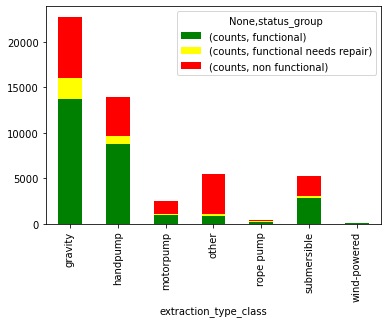

In [21]:
df2 = df_pump_train.copy().groupby(['extraction_type_class','status_group']).size().reset_index(name='counts')
df2 = pd.pivot_table(df2,index='extraction_type_class',columns='status_group')
df2.plot(kind='bar', stacked=True, color=['green','yellow','red'])

Lässt sich ein Zusammenhang zwischen dem Management und dem Status erkennen?

<AxesSubplot:xlabel='management'>

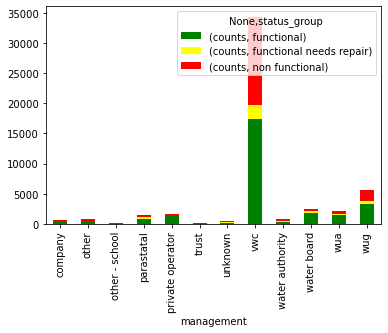

In [22]:
df2 = df_pump_train.copy().groupby(['management','status_group']).size().reset_index(name='counts')
df2 = pd.pivot_table(df2,index='management',columns='status_group')
df2.plot(kind='bar', stacked=True, color=['green','yellow','red'])

Lässt sich ein Zusammenhang zwischen Zahlungsart und dem Status erkennen?

<AxesSubplot:xlabel='payment_type'>

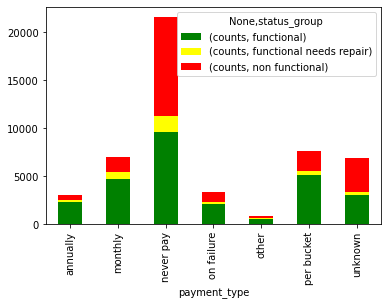

In [23]:
df2 = df_pump_train.copy().groupby(['payment_type','status_group']).size().reset_index(name='counts')
df2 = pd.pivot_table(df2,index='payment_type',columns='status_group')
df2.plot(kind='bar', stacked=True, color=['green','yellow','red'])

Lässt sich ein Zusammenhang zwischen der Wasserqualität und dem Status erkennen?

<AxesSubplot:xlabel='quality_group'>

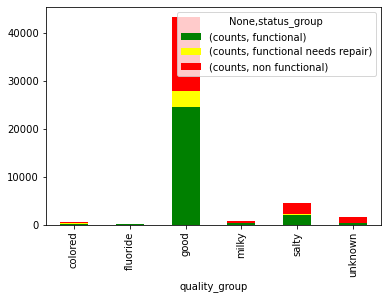

In [24]:
df2 = df_pump_train.copy().groupby(['quality_group','status_group']).size().reset_index(name='counts')
df2 = pd.pivot_table(df2,index='quality_group',columns='status_group')
df2.plot(kind='bar', stacked=True, color=['green','yellow','red'])

Lässt sich ein Zusammenhang zwischen der Wassermenge und dem Status erkennen?

<AxesSubplot:xlabel='quantity_group'>

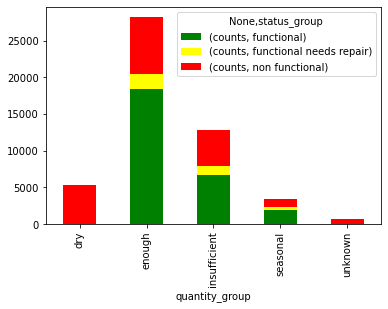

In [25]:
df2 = df_pump_train.copy().groupby(['quantity_group','status_group']).size().reset_index(name='counts')
df2 = pd.pivot_table(df2,index='quantity_group',columns='status_group')
df2.plot(kind='bar', stacked=True, color=['green','yellow','red'])

Lässt sich ein Zusammenhang zwischen der Art der Wasserquelle und dem Status erkennen?

<AxesSubplot:xlabel='source_type'>

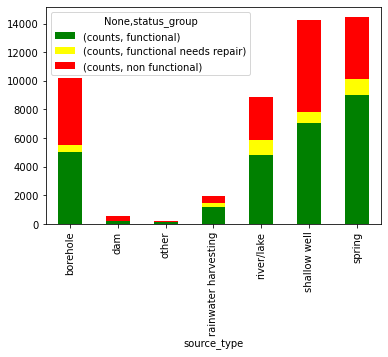

In [26]:
df2 = df_pump_train.copy().groupby(['source_type','status_group']).size().reset_index(name='counts')
df2 = pd.pivot_table(df2,index='source_type',columns='status_group')
df2.plot(kind='bar', stacked=True, color=['green','yellow','red'])

Lässt sich ein Zusammenhang zwischen der Art des Brunnens und dem Status erkennen?

<AxesSubplot:xlabel='waterpoint_type_group'>

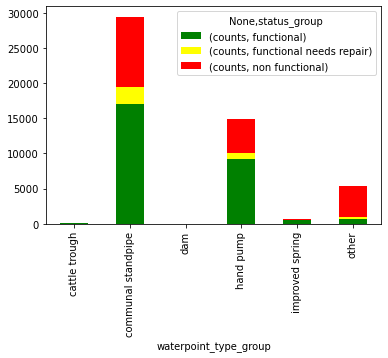

In [27]:
df2 = df_pump_train.copy().groupby(['waterpoint_type_group','status_group']).size().reset_index(name='counts')
df2 = pd.pivot_table(df2,index='waterpoint_type_group',columns='status_group')
df2.plot(kind='bar', stacked=True, color=['green','yellow','red'])

# Data Preparation

## High Cardinality Features

### Funder

Die Variable `funder` hat 1734 unterschiedliche Ausprägungen:

In [111]:
df_pump_train['funder'].describe()

count                      47396
unique                      1734
top       Government Of Tanzania
freq                        7697
Name: funder, dtype: object

Zusätzlich gibt es 3094 Einträge, für die kein `funder` hinterlegt ist:

In [116]:
df_pump_train['funder'].isna().sum()

3094

Die Verteilung auf die unterschiedlichen `funder` ist dabei sehr ungleich.

<AxesSubplot:>

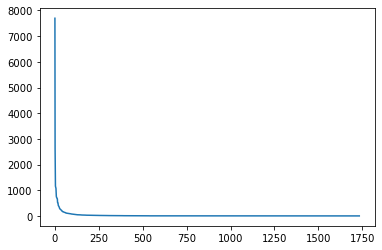

In [118]:
df_funders = df_pump_train['funder'].value_counts(ascending=False).reset_index()
df_funders['percent'] = (df_funders['funder'] / df_funders['funder'].sum()) * 100
df_funders['funder'].plot()

Das Government Of Tanzania hat am meisten Brunnen finanziert (16.2 %).

In [124]:
df_funders.head(10)

,index,funder,percent
0,Government Of Tanzania,7697,16.239767
1,Danida,2627,5.542662
2,Hesawa,1868,3.941261
3,Rwssp,1160,2.447464
4,World Bank,1130,2.384167
5,Kkkt,1115,2.352519
6,World Vision,1071,2.259684
7,Unicef,912,1.924213
8,Tasaf,764,1.611950
9,Private Individual,730,1.540214


Für die fehlenden Werte können wir einen neue Kategorie "Unknown" erstellen.

In [385]:
df_funders = df_pump_train['funder'].fillna('Unknown').value_counts(ascending=False).reset_index()
df_funders['percent'] = (df_funders['funder'] / df_funders['funder'].sum()) * 100

df_funders.head(10)

,index,funder,percent
0,Government Of Tanzania,7489,15.296785
1,Unknown,3087,6.305405
2,Danida,2627,5.365824
3,Hesawa,1624,3.317129
4,World Bank,1127,2.301973
5,Kkkt,1115,2.277462
6,World Vision,1050,2.144695
7,Rwssp,1005,2.052780
8,Unicef,891,1.819927
9,Private Individual,728,1.486989


Durch die hohe Kardinalität der Variable `funder` ist eine die Transformation zu Integer-Kategorien und anschließend ein One-Hot-Encoding nicht sinnvoll umsetzbar, da eine große Anzahl an zusätzlichen Spalten das Modell stark verlangsamen würde. Auswahl möglicher Vorgehen: 
- Feature nicht für das Modell nutzen, da geringe Korrelation mit Target
- Target Encoding des Features

[Weitere Informationen zu Categorical Data Encoding ->](https://towardsdatascience.com/smarter-ways-to-encode-categorical-data-for-machine-learning-part-1-of-3-6dca2f71b159)

### Installer

Für die Variable `installer` zeigt sich ein ähnliches Bild wie für `funder`.

In [156]:
df_pump_train['installer'].describe()

count     47380
unique     1964
top         DWE
freq      14799
Name: installer, dtype: object

In [158]:
df_pump_train['installer'].isna().sum()

3110

<AxesSubplot:>

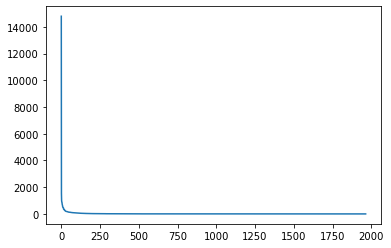

In [160]:
df_installers = df_pump_train['installer'].value_counts(ascending=False).reset_index()
df_installers['percent'] = (df_installers['installer'] / df_installers['installer'].sum()) * 100
df_installers['installer'].plot()

In [161]:
df_installers.head(10)

,index,installer,percent
0,DWE,14799,31.234698
1,Government,1534,3.237653
2,RWE,1015,2.142254
3,Commu,897,1.893204
4,DANIDA,883,1.863656
5,KKKT,783,1.652596
6,Hesawa,712,1.502744
7,0,675,1.424652
8,TCRS,617,1.302237
9,CES,523,1.103841


Bei den fehlenden Werten können wir gleich verfahren wie zuvor.

In [386]:
df_installers = df_pump_train['installer'].fillna('Unknown').value_counts(ascending=False).reset_index()
df_installers['percent'] = (df_installers['installer'] / df_installers['installer'].sum()) * 100

df_installers.head(10)

,index,installer,percent
0,DWE,13840,28.269129
1,Unknown,3098,6.327873
2,Government,1399,2.857551
3,RWE,995,2.032354
4,Commu,897,1.832183
5,DANIDA,883,1.803587
6,KKKT,782,1.597287
7,Hesawa,680,1.388946
8,0,675,1.378733
9,TCRS,617,1.260264


Es kann erneut Target Encoding eingesetzt werden. 

*Anmerkung: Für Regressions-Modelle wäre dieses Vorgehen aufgrund des Data Leakage problematisch!"*

### wpt_name

Auch das Feature `wpt_name` hat sehr viele unterschiedliche Ausprägungen.

In [324]:
df_pump_train['wpt_name'].describe()

count     50490
unique    32390
top        none
freq       3026
Name: wpt_name, dtype: object

Es gibt allerdings keine Nullwerte. Für Brunnen, bei denen kein Name bekannt ist, wurde "none" eingesetzt.

In [165]:
df_pump_train['wpt_name'].isna().sum()

0

Demnach macht die Kategorie "none" einen großen Teil der Namen aus, aber auch andere Werte kommen mehrmals vor.

In [170]:
df_names = df_pump_train['wpt_name'].value_counts(ascending=False).reset_index()
df_names['percent'] = (df_names['wpt_name'] / df_names['wpt_name'].sum()) * 100

df_names.head(10)

,index,wpt_name,percent
0,none,3026,5.993266
1,Shuleni,1477,2.925332
2,Zahanati,712,1.410180
3,Msikitini,452,0.895227
4,Kanisani,268,0.530798
5,Bombani,236,0.467419
6,Sokoni,222,0.439691
7,Ofisini,210,0.415924
8,School,178,0.352545
9,Shule Ya Msingi,164,0.324817


Ein One-vs.-All Vorgehen kann für eingesetzt werden. Wir unterscheiden nun nur noch, ob ein Name bekannt ist oder nicht.

In [328]:
from sklearn.base import BaseEstimator, TransformerMixin

class YesNoEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, add_column = True):
        self.add_column = add_column
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        if self.add_column:
            has_name = np.where(X['wpt_name']!= 'none', 1, 0)
            Xcopy = X
            Xcopy['wpt_name'] = has_name
        return Xcopy

### num_private

Es ist nicht bekannt wofür die Variable `num_private` steht.

In [174]:
df_pump_train['wpt_name'].describe()

count    50490.000000
mean         0.940067
std          0.237364
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: wpt_name, dtype: float64

Es gibt keine Nullwerte.

In [175]:
df_pump_train['wpt_name'].isna().sum()

0

Allerdings haben 98.7 % der Einträge die Ausprägung 0 als `num_private`.

In [181]:
df_num_private = df_pump_train['num_private'].value_counts(ascending=False).reset_index()
df_num_private['percent'] = (df_num_private['num_private'] / df_num_private['num_private'].sum()) * 100

print('Unterschiedliche num_private Ausprägungen: ', df_num_private.shape[0])
df_num_private.head(10)

Unterschiedliche num_private Ausprägungen:  62


,index,num_private,percent
0,0,49839,98.710636
1,6,70,0.138641
2,1,57,0.112894
3,8,45,0.089127
4,5,39,0.077243
5,15,32,0.063379
6,45,32,0.063379
7,32,30,0.059418
8,39,27,0.053476
9,3,26,0.051495


Aufgrund der geringen Aussagekraft wird das Feature nicht für das Modell berücksichtigt.

In [188]:
df_pump_train = df_pump_train.drop(['num_private'], axis=1)

## Geographic Features

In [419]:
import plotly.express as px

def createMapWithFeature(feature):
    fig = px.scatter_mapbox(df_pump_train, lat="latitude", lon="longitude", color=feature, zoom=5, opacity=0.25, hover_name="id")
    fig.update_layout(
        mapbox_style="carto-positron",
        margin={"r":0,"t":0,"l":0,"b":0}
    )
    fig.show()

In [422]:
createMapWithFeature("status_group")

### gps_height

In [370]:
createMapWithFeature("gps_height")

Bei der `gps_height`handelt es sich um einen numerischen Wert zwischen -90 und 2770 Metern.

In [190]:
df_pump_train['gps_height'].describe()

count    50490.00000
mean       669.71428
std        693.12333
min        -90.00000
25%          0.00000
50%        371.00000
75%       1322.00000
max       2770.00000
Name: gps_height, dtype: float64

Für alle Einträge ist eine `gps_height` vorhanden.

In [192]:
df_pump_train['gps_height'].isna().sum()

0

Allerdings ist für einen großen Teil der Einträge 0 Meter vermerkt, was darauf hindeuten kann, dass hier in Wahrheit keine Informationen über die eigentliche Höhe vorliegen.

In [199]:
pumps_at_zero = df_pump_train[df_pump_train['gps_height']==0].shape[0]
pumps_at_zero_perc = round(df_pump_train[df_pump_train['gps_height']==0].shape[0] / df_pump_train.shape[0] * 100, 2)
print(f"{pumps_at_zero} Brunnen, das sind {pumps_at_zero_perc} % aller Brunnen, liegen auf 0 Meter Meereshöhe.")

17337 Brunnen, das sind 34.34 % aller Brunnen, liegen auf 0 Meter Meereshöhe.


Numerische Werte auf unterschiedlichen Skalen müssen Normalisiert werden.

### Longitude + Latitude

In [204]:
df_pump_train[['longitude', 'latitude']].describe()

,longitude,latitude
count,50490.000000,5.049000e+04
mean,34.078591,-5.708336e+00
std,6.553382,2.943806e+00
min,0.000000,-1.164838e+01
25%,33.084409,-8.541643e+00
50%,34.906548,-5.019807e+00
75%,37.178899,-3.327550e+00
max,40.345193,-2.000000e-08


In [206]:
long_at_zero = df_pump_train[df_pump_train['longitude']==0].shape[0]
long_at_zero_perc = round(long_at_zero / df_pump_train.shape[0] * 100, 2)
print(f"{long_at_zero} Brunnen, das sind {long_at_zero_perc} % aller Brunnen, liegen auf Longitude 0.")

lat_at_zero = df_pump_train[df_pump_train['latitude']==0].shape[0]
lat_at_zero_perc = round(lat_at_zero / df_pump_train.shape[0] * 100, 2)
print(f"{lat_at_zero} Brunnen, das sind {lat_at_zero_perc} % aller Brunnen, liegen auf Latitude 0.")

1532 Brunnen, das sind 3.03 % aller Brunnen, liegen auf Longitude 0.
0 Brunnen, das sind 0.0 % aller Brunnen, liegen auf Latitude 0.


Die Lage der Brunnen auf Longitude 0 scheint, unwahrscheinlich (siehe Karte). Das Ersetzen der Werte scheint nicht sinnvoll. Die Einträge mit einer Latitude von 0 könnte aus dem Trainingsdatensatz aussortiert werden.

In [336]:
#df_pump_train = df_pump_train.drop(df_pump_train[df_pump_train.longitude == 0].index)

Auch diese Features müssen aufgrund ihrer Skalierung angepasst werden.

### Basin

In [371]:
createMapWithFeature("basin")

Für alle Einträge ist ein Wasserreservoir (`basin`) hinterlegt.

In [210]:
df_pump_train['basin'].describe()

count             50490
unique                9
top       Lake Victoria
freq               8645
Name: basin, dtype: object

Die Einträge sind unauffällig auf die Reservoirs verteilt.

<AxesSubplot:ylabel='index'>

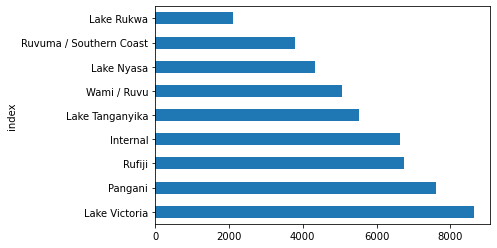

In [220]:
df_basin = df_pump_train['basin'].value_counts(ascending=False).reset_index()
df_basin['percent'] = (df_basin['basin'] / df_basin['basin'].sum()) * 100

df_basin.set_index('index')['basin'].plot(kind='barh')

In [222]:
df_basin.head(df_basin.shape[0])

,index,basin,percent
0,Lake Victoria,8645,17.122202
1,Pangani,7622,15.096059
2,Rufiji,6751,13.370965
3,Internal,6629,13.129333
4,Lake Tanganyika,5520,10.932858
5,Wami / Ruvu,5078,10.057437
6,Lake Nyasa,4346,8.607645
7,Ruvuma / Southern Coast,3802,7.530204
8,Lake Rukwa,2097,4.153298


Da es sich nicht um ordinal values handelt ist ein reines Label Encoding hier fehlleitend. Allerdings handelt es sich nicht um ein Feature mit hoher Kardinalität, somit können wir auf One Hot Encoding zurückgreifen, um dies zu umgehen.

### Subvillage

Die Brunnen sind auf einen große Anzahl unterschiedlicher `subvillage` Ausprägungen verteilt.

In [224]:
df_pump_train['subvillage'].describe()

count       50175
unique      17774
top       Shuleni
freq          430
Name: subvillage, dtype: object

In [225]:
df_pump_train['subvillage'].isna().sum()

315

Für die Brunnen bei denen kein `subvillage` hinterlegt ist, erstellen wir eine neue Kategorie.

<AxesSubplot:>

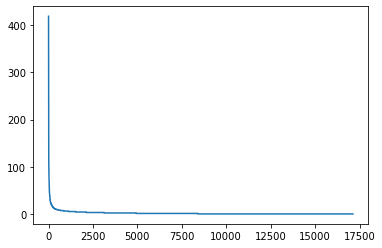

In [387]:
df_subvillage = df_pump_train['subvillage'].fillna('Unknown').value_counts(ascending=False).reset_index()
df_subvillage['percent'] = (df_subvillage['subvillage'] / df_subvillage['subvillage'].sum()) * 100
df_subvillage['subvillage'].plot()

In [388]:
df_subvillage.head(10)

,index,subvillage,percent
0,Shuleni,418,0.853793
1,Majengo,412,0.841538
2,Madukani,372,0.759835
3,Unknown,315,0.643409
4,Kati,315,0.643409
5,Mtakuja,216,0.441194
6,Sokoni,199,0.406471
7,M,165,0.337024
8,Muungano,141,0.288002
9,Mbuyuni,133,0.271661


Aufgrund der vielen unterschiedlichen Ausprägungen nutzen wir wieder Target Encoding. 

### Region + Region_code

In [373]:
createMapWithFeature("region")

In [382]:
df_pump_train.region_code = df_pump_train.region_code.astype('category')
df_pump_train[['region', 'region_code']].describe()

,region,region_code
count,48958,48958
unique,21,27
top,Iringa,11
freq,4495,4498


Die Feature `region` und `region_code` scheinen Überschneidungen zu haben, jedoch können sie nicht 1:1 übersetzt werden. Es gibt mehr `region_code` Ausprägungen als unterschiedliche `region` Werte.

In [253]:
reg_size = df_pump_train['region'].unique().size
reg_c_size = df_pump_train['region_code'].unique().size

print(f"region hat {reg_size} unterschiedliche Ausprägungen")
print(f"region_code hat {reg_c_size} unterschiedliche Ausprägungen")

region hat 21 unterschiedliche Ausprägungen
region_code hat 27 unterschiedliche Ausprägungen


<AxesSubplot:>

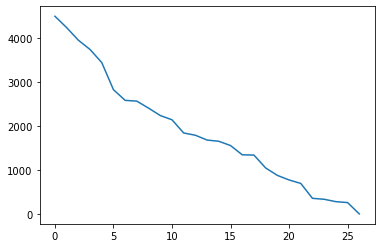

In [243]:
df_region_c = df_pump_train['region_code'].value_counts(ascending=False).reset_index()
df_region_c['percent'] = (df_region_c['region_code'] / df_region['region_code'].sum()) * 100
df_region_c['region_code'].plot()

<AxesSubplot:>

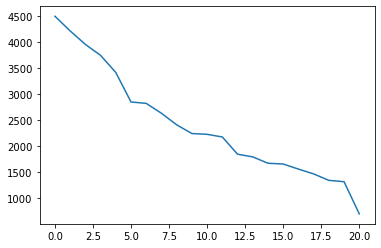

In [246]:
df_region = df_pump_train['region'].value_counts(ascending=False).reset_index()
df_region['percent'] = (df_region['region'] / df_region['region'].sum()) * 100
df_region['region'].plot()

In [250]:
df_region_c.head(10)

,index,region_code,percent
0,11,4499,8.910675
1,17,4241,8.399683
2,12,3954,7.831254
3,3,3743,7.413349
4,5,3445,6.823133
5,18,2828,5.601109
6,19,2585,5.119826
7,2,2567,5.084175
8,16,2408,4.769261
9,10,2240,4.436522


In [251]:
df_region.head(10)

,index,region,percent
0,Iringa,4495,8.902753
1,Shinyanga,4213,8.344227
2,Mbeya,3954,7.831254
3,Kilimanjaro,3743,7.413349
4,Morogoro,3414,6.761735
5,Arusha,2847,5.638740
6,Kagera,2820,5.585264
7,Mwanza,2630,5.208952
8,Kigoma,2408,4.769261
9,Ruvuma,2240,4.436522


One Hot Encoding würde sehr viele Dimensionen erzeugen. Mit Binary Encoding lassen sich die entstehenden Dimensionen reduzieren.

*Überlegung: Nur eines der beiden Features nutzen, da große Überschneidungen?*

### district_code

In [375]:
df_pump_train.district_code = df_pump_train.district_code.astype('category')

createMapWithFeature("district_code")

Der `district_code` muss als kategorisches und nicht als numerisches Feature behandelt werden.

In [376]:
df_pump_train['district_code'].describe()

count     48958
unique       20
top           1
freq       9497
Name: district_code, dtype: int64

In [256]:
dist_size = df_pump_train['district_code'].unique().size

print(f"district_code hat {dist_size} unterschiedliche Ausprägungen")


district_code hat 20 unterschiedliche Ausprägungen


<AxesSubplot:>

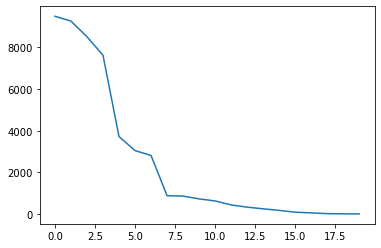

In [377]:
df_dist_c = df_pump_train['district_code'].value_counts(ascending=False).reset_index()
df_dist_c['percent'] = (df_dist_c['district_code'] / df_dist_c['district_code'].sum()) * 100
df_dist_c['district_code'].plot()

In [378]:
df_dist_c.head(10)

,index,district_code,percent
0,1,9497,19.398260
1,2,9265,18.924384
2,3,8514,17.390416
3,4,7626,15.576617
4,5,3721,7.600392
5,6,3047,6.223702
6,7,2814,5.747784
7,8,881,1.799502
8,30,863,1.762735
9,33,727,1.484946


### Local government area (LGA)

Der Begriff LGA wird von unterschiedlichen Staaten zur Bezeichnung von lokalen Verwaltungsgebieten der Kommunalverwaltung genutzt.

Beispiel [Region Njombe in Tansania](https://de.wikipedia.org/wiki/Njombe_(Region))

In [263]:
df_pump_train['lga'].describe()

count      50490
unique       125
top       Njombe
freq        2125
Name: lga, dtype: object

<AxesSubplot:>

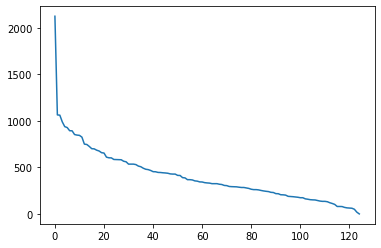

In [264]:
df_lga = df_pump_train['lga'].value_counts(ascending=False).reset_index()
df_lga['percent'] = (df_lga['lga'] / df_lga['lga'].sum()) * 100
df_lga['lga'].plot()

In [265]:
df_lga.head(10)

,index,lga,percent
0,Njombe,2125,4.208754
1,Moshi Rural,1065,2.109329
2,Arusha Rural,1062,2.103387
3,Bariadi,990,1.960784
4,Kilosa,939,1.859774
5,Rungwe,929,1.839968
6,Kasulu,895,1.772628
7,Mbozi,894,1.770648
8,Meru,854,1.691424
9,Bagamoyo,848,1.679541


### Ward

dt. der Stadtbezirk

In [268]:
df_pump_train['ward'].describe()

count     50490
unique     2085
top       Igosi
freq        249
Name: ward, dtype: object

<AxesSubplot:>

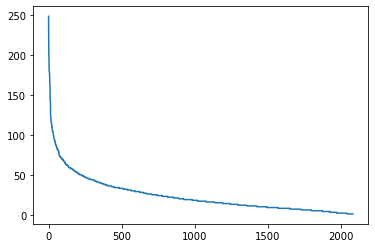

In [269]:
df_ward = df_pump_train['ward'].value_counts(ascending=False).reset_index()
df_ward['percent'] = (df_ward['ward'] / df_ward['ward'].sum()) * 100
df_ward['ward'].plot()

In [270]:
df_ward.head(10)

,index,ward,percent
0,Igosi,249,0.493167
1,Imalinyi,219,0.433749
2,Siha Kati,199,0.394137
3,Mdandu,197,0.390176
4,Nduruma,181,0.358487
5,Chalinze,180,0.356506
6,Kitunda,179,0.354526
7,Mishamo,177,0.350564
8,Msindo,168,0.332739
9,Maji ya Chai,163,0.322836


## Pipeline

[Categoric Encoder Package ->](https://contrib.scikit-learn.org/category_encoders/index.html)

In [415]:
from category_encoders import TargetEncoder, BinaryEncoder
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_validate

#df_pump_train = pd.read_csv('pump_train.csv')

x_train = df_pump_train.loc[:, ['funder', 'gps_height', 'installer', 'longitude', 'latitude', 
                            'wpt_name', 'basin', 'subvillage', 'region',
                            'region_code', 'district_code', 'lga', 'ward']]

imputer = SimpleImputer(strategy='constant', fill_value='Unknown')
imputer = imputer.fit(x_train[['funder', 'installer', 'subvillage']])
x_train[['funder', 'installer', 'subvillage']] = imputer.transform(x_train[['funder', 'installer', 'subvillage']])

y_train = df_pump_train.loc[:,'status_group']
y_train = LabelEncoder().fit_transform(y_train)

col_trans = ColumnTransformer(transformers=[
    ['target_enc', TargetEncoder(), ['funder', 'installer', 'subvillage', 'lga', 'ward']],
    ['std_scalar', StandardScaler(), ['gps_height', 'longitude', 'latitude']],
    ['oh_enc', OneHotEncoder(), ['basin']],
    ['bin_enc', BinaryEncoder(), ['basin', 'region', 'region_code', 'district_code']],
    ['cust_trans', YesNoEncoder(), ['wpt_name']]
], remainder='drop')

pipeline = Pipeline([
    ('col_trans', col_trans),
    ('tree', DecisionTreeClassifier(max_depth=10))
])

result = pipeline.fit(x_train, y_train)
result[0]
scores = cross_validate(pipeline, x_train, y_train)
scores['test_score'].mean()

/Users/hammerer/opt/anaconda3/lib/python3.9/site-packages/category_encoders/target_encoder.py:92: FutureWarning:

Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327

/Users/hammerer/opt/anaconda3/lib/python3.9/site-packages/category_encoders/target_encoder.py:97: FutureWarning:

Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327

/Users/hammerer/opt/anaconda3/lib/python3.9/site-packages/category_encoders/target_encoder.py:92: FutureWarning:

Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327

/Users/hammerer/opt/anaconda3/lib/python3.9/site-packages/category_encoders/target_encoder.py:97: FutureWarning:

Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327

/Users/hammere

0.6672212319271142